In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

In [3]:
df = pd.read_csv("datasets/luftklima_reformatted.csv")

In [4]:
df.head()

,Station-ID,Name,Zeitstempel,Lufttemperatur,Regen in 1 h,Regen in 24 h,Regen in 48 h,longitude,latitude,year,month,day,hour,minute
0,034003A0,Lindenplatz (Park),2020-11-03 01:04:00+01:00,14.985,0.0,0.0,0.0,47.558010,7.560240,2020,11,3,1,4
1,034003AB,Birsstrasse,2020-11-03 00:50:23+01:00,14.380,0.0,0.0,1.8,47.544870,7.622100,2020,11,3,0,50
2,034003AC,Avenue General de Gaulle,2020-11-03 00:58:05+01:00,15.275,0.0,0.0,1.6,47.581168,7.553681,2020,11,3,0,58
3,034003B0,Gotthelfstrasse,2020-11-03 01:06:22+01:00,15.625,0.0,4.2,4.2,47.552820,7.569130,2020,11,3,1,6
4,03409964,Schäferrain,2020-11-03 01:07:21+01:00,17.570,0.0,0.4,0.8,47.494620,7.624410,2020,11,3,1,7


In [5]:
df.Zeitstempel.max()

'2021-11-10 15:10:05+01:00'

In [6]:
df.Zeitstempel.min()

'2020-02-11 14:54:06+01:00'

In [7]:
# lets do 2021-11-09
day = df[(df.year == 2021) & (df.month == 11) & (df.day == 6)]

In [32]:
# and start with 06:00
six = day[day.hour == 11]

In [33]:
len(six)

120

In [34]:
six = six.reset_index()

In [35]:
map_bounds = [7.5629, 7.6364, 47.5313, 47.5781]

In [36]:
basel = plt.imread("maps/basel_heat_test.png")

In [37]:
# first plot the individual points
lats = six.latitude
longs = six.longitude
temp = six.Lufttemperatur

In [38]:
temp.min()

-0.01

In [39]:
lats

0      7.603300
1      7.583670
2      7.648980
3      7.613570
4      7.594741
         ...   
115    7.567380
116    7.583040
117    7.580680
118    7.593810
119    7.573550
Name: latitude, Length: 120, dtype: float64

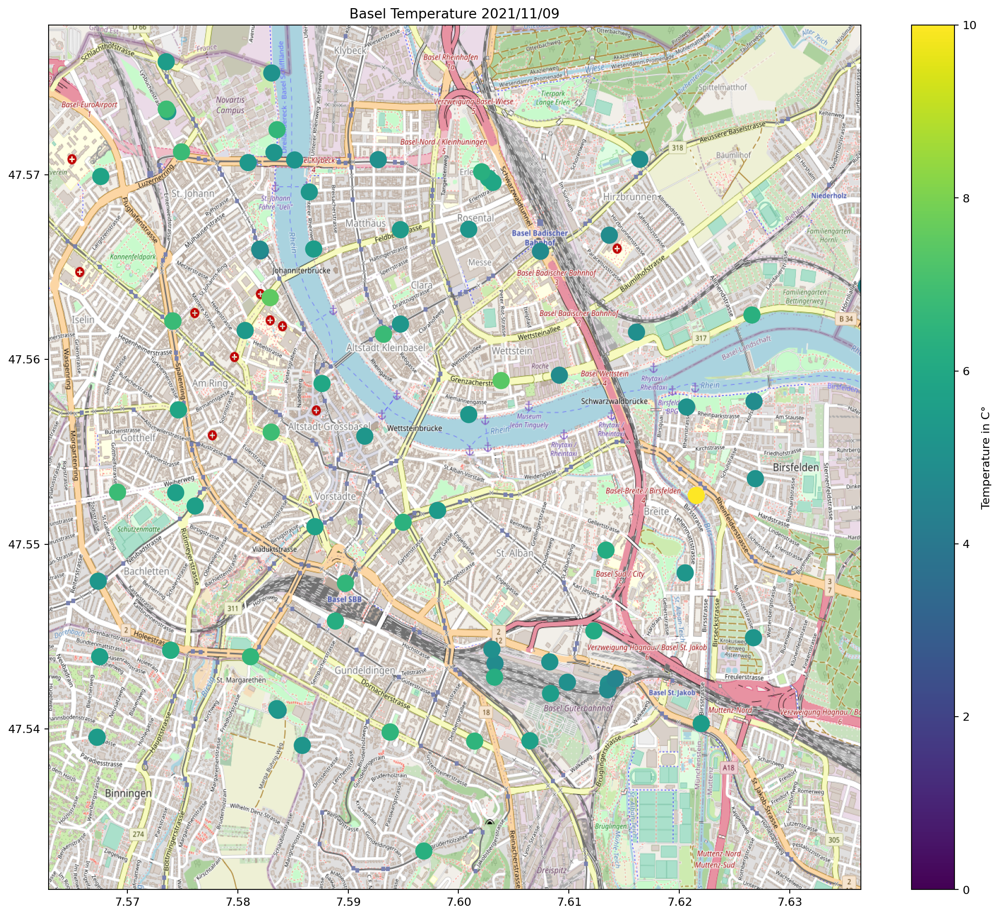

In [40]:
plt.figure(figsize=(16, 14), dpi=160)
plt.scatter(lats, longs, marker="o", zorder=1, c=temp, s=200)
plt.title("Basel Temperature 2021/11/09")
plt.colorbar(label="Temperature in C°")
plt.clim(0, 10)
plt.xlim(map_bounds[0], map_bounds[1])
plt.ylim(map_bounds[2], map_bounds[3])
plt.imshow(basel, zorder=0, extent=map_bounds, aspect="auto")
plt.show()

In [17]:
points = []
for i in range(len(lats)):
    points.append([lats[i], longs[i]])
points = np.array(points)

In [18]:
grid_x, grid_y = np.mgrid[map_bounds[0]:map_bounds[1]:100j, map_bounds[2]:map_bounds[3]:100j]

In [19]:
grid = griddata(points, temp, (grid_x, grid_y), method="cubic")

In [20]:
basel_bw = plt.imread("maps/basel_heat_bw.png")

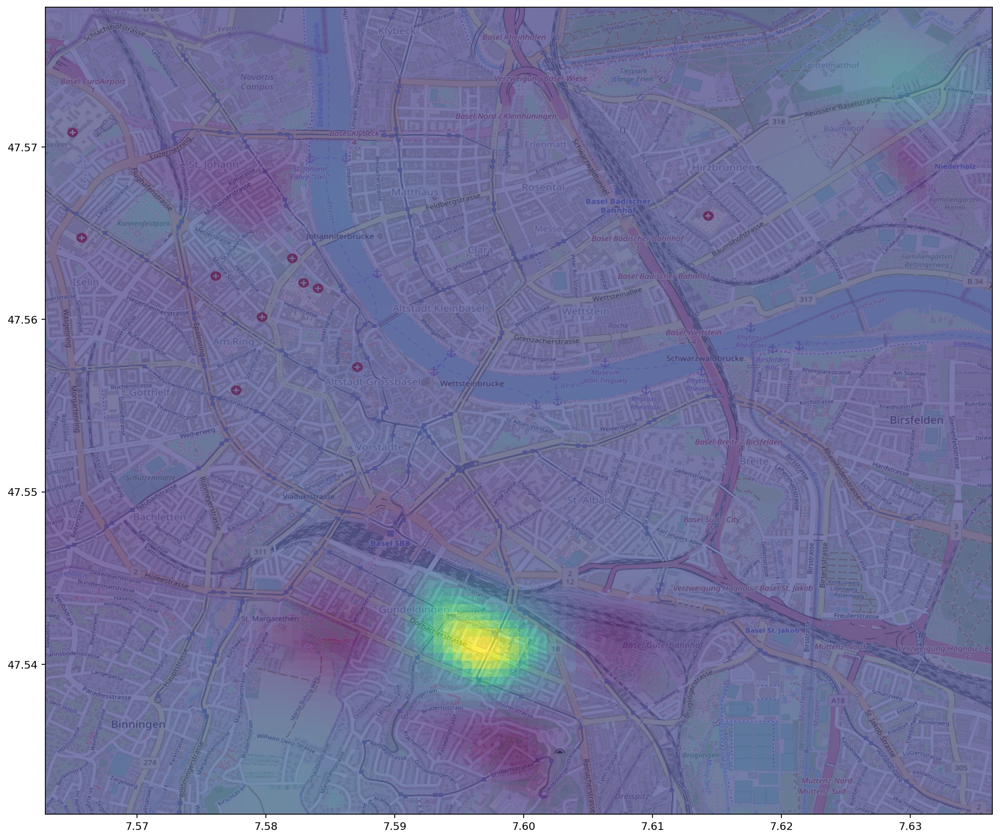

In [21]:
plt.figure(figsize=(16, 14), dpi=160)
plt.imshow(grid, extent=map_bounds, zorder=1, alpha=0.7)
plt.imshow(basel, extent=map_bounds, zorder=0, aspect="auto")
plt.show()